# Evaluative Feedback

This notebook follows along in Chapter 2 of Sutton & Barto.  Specifically, we implement the different evaluative feedback methods including:
- Greedy & $\epsilon$-Greedy Methods: See the `Experiment` class
    - We also implement the 10-armed test suite as discussed, but use a smaller number of default experiments due to the computation time required: See the `MasterExperiment` class
- 

## Ch 2.1 - Greedy and $\epsilon$-Greedy Methods

### 10-Armed Testbed
Implement n-armed bandit problem for greedy / epsilon-greedy methods. We use $n=10$ with the following:

- $Q^*(a)$ is the _true_ value of action $a$
- $Q_t(a)$ is the _estimated_ value of action $a$ at the $t$th play
- We create a single Experiment by first selecting $Q^*(a)$ for each of the n tasks according to a normal distribution with $\mu=0$ and $\sigma=1$.

In [1]:
import secrets
import pandas as pd
import numpy as np
import plotly.express as px

In [66]:
class Experiment:
    """An Experiment implements the n-armed bandit problem for a specified number of arms (actions)."""
    def __init__(self, n_arms: int, epsilon=0, plays=1000, std_dev=1):
        self.actions = list(range(n_arms))
        self.epsilon = epsilon
        assert epsilon >= 0 and epsilon <= 1
        self.plays = plays
        self.std_dev=std_dev
        self.t = 0
        self.q_actual = np.empty([n_arms])
        self.q_t = np.zeros([plays, n_arms])  # first dim - time, 2nd dim - action-value
        self.ar_t = []
        self.a_count = {}
        self.rng = np.random.default_rng()
        
        # initialize with random values
        for action in self.actions:
            self.q_actual[action] = self.rng.standard_normal()
            
            # the amount of times each action has been selected
            # is initialized at 0
            self.a_count[action] = 0
        
    def __str__(self):
        return f"eps {self.epsilon}"
    
    def get_optimal_action(self):
        """Return the index of the optimal action"""
        return np.argmax(self.q_actual)
    
    def get_optimal_action_value(self):
        """Return the actual value of the optimal action"""
        return np.max(self.q_actual)
    
    def get_greedy_action(self):
        """Return the action corresponding to the maximum estimated value of the previous time"""
        t_prev = self.t - 1
        return np.argmax(self.q_t[t_prev])
    
    def select_epsilon_greedy(self):
        """Select a random action epsilon percent of the time, else select greedy."""
        rand = self.rng.random()
        if rand <= self.epsilon:
            return secrets.choice(self.actions)
        else:
            return self.get_greedy_action()
        
    def update_q_t(self):
        for action in self.actions:
            # If the action hasn't been selected before we do this to avoid
            # division by 0 error
            if self.a_count[action] == 0:
                self.q_t[self.t, action] = 0
            else:
                all_rewards = [time['reward'] for time in self.ar_t if time['action'] == action]
                updated = sum(all_rewards) / self.a_count[action]
                self.q_t[self.t, action] = updated
        
    def update_ar_t(self, a, r):
        self.ar_t.append({"action": a, "reward": r})
        self.a_count[a] += 1
        
    def sample_reward(self, action: int):
        """Get a sample reward for the specified action."""
        return self.rng.normal(self.q_actual[action], self.std_dev)
    
    def update_all(self, action):
        reward = self.sample_reward(action)
        self.update_ar_t(action, reward)
        self.update_q_t()
        self.t += 1
        
    def run(self):
        # First we run through and select each action 1x
        # to initialize the estimate of q (the value of each action)
        for action in self.actions:
            self.update_all(action)
        
        # We discount for the number of plays we've already implemented
        for play in range(len(self.actions), self.plays):
            action = self.select_epsilon_greedy()
            self.update_all(action)
        
    def calc_percent_optimal_action(self):
        opt_action = self.get_optimal_action()
        self.opt_action_chosen = []
        num_times_chosen = 0
        for t,ar_t in enumerate(self.ar_t):
            if ar_t['action'] == opt_action:
                num_times_chosen += 1
            self.opt_action_chosen.append(num_times_chosen/(t+1))

def plot_q_t(experiment):
    """Plot the estimated action value for each action in the experiment over time"""
    data = {}
    t = list(range(experiment.plays))
    data['time'] = t
    
    for action in experiment.actions:
        vals = []
        for t in range(len(experiment.ar_t)):
            vals.append(experiment.q_t[t,action])
        data[f"Action_{action}"] = vals
        
    df = pd.DataFrame(data)
    df_long = pd.melt(df, id_vars=['time'], value_name="value_est", var_name="action")
    fig = px.line(df_long, x="time", y="value_est", color="action", title=f"Action Values over time with {experiment}")
    spacing = experiment.plays / len(experiment.actions)
    pos = 0
    for action in experiment.actions:
        fig.add_annotation(x=pos, y=experiment.q_actual[action], text=f"A{action}_{experiment.q_actual[action]:.4f}", showarrow=False)
        pos += spacing
    fig.show()
    
def plot_percent_cumsum(experiments):
    """Plot the percent cumulative some of rewards for different experiments"""
    data = {}
    t = list(range(experiments[0].plays))
    data['time'] = t
    for experiment in experiments:
        rewards = [time['reward'] for time in experiment.ar_t]
        total_available_rewards = [experiment.get_optimal_action_value() * (t + 1) for t in range(experiment.plays)]
        cumsum = np.cumsum(rewards)
        data[str(experiment)] = [i/j for i,j in zip(cumsum, total_available_rewards)]
    df = pd.DataFrame(data)
    df_long = pd.melt(df, id_vars=['time'], value_name="cum_reward", var_name="experiment")
    fig = px.line(df_long, x="time", y="cum_reward", color="experiment", title="Percent Cumulative Sum of Rewards Over Time")
    fig.show()

def plot_percent_optimal_action(experiments):
    data = {}
    t = list(range(experiments[0].plays))
    data['time'] = t
    for experiment in experiments:
        opt_action = experiment.get_optimal_action()
        opt_action_chosen = []
        num_times_chosen = 0
        for t,ar_t in enumerate(experiment.ar_t):
            if ar_t['action'] == opt_action:
                num_times_chosen += 1
            opt_action_chosen.append(num_times_chosen/(t+1))
        data[str(experiment)] = opt_action_chosen
    df = pd.DataFrame(data)
    df_long = pd.melt(df, id_vars=['time'], value_name="perc_optimal", var_name="experiment")
    fig = px.line(df_long, x="time", y="perc_optimal", color="experiment", title="Percent of Time Optimal Action Chosen")
    fig.show()

## Run the Experiments

We run the experiment three times with different $\epsilon$ values. The `plot_percent_cumsum` graph plots, for each experiment, the cumulative value of the reward actually received by the expected total cumulative value. The expected total cumulative value is calculated from the maximum of the __actual rewards__ (`q_actual`). Initially, the graph might plot values over 1 or under 0. This is because we might select an action whose __sampled reward__ (`q_t`) is positive / negative. Over time, the values should converge between 0 and 1. Additionally, we plot the percent of time the optimal action was actually chosen (`plot_percent_optimal_action`).

In [67]:
n_arms = 10
plays = 4000
std_dev = 0
e1 = Experiment(n_arms, plays=plays, std_dev=std_dev)
e1.run()
e2 = Experiment(n_arms, epsilon=0.01, plays=plays, std_dev=std_dev)
e2.run()
e3 = Experiment(n_arms, epsilon=0.1, plays=plays, std_dev=std_dev)
e3.run()
e4 = Experiment(n_arms, epsilon=0.999, plays=plays, std_dev=std_dev)
e4.run()

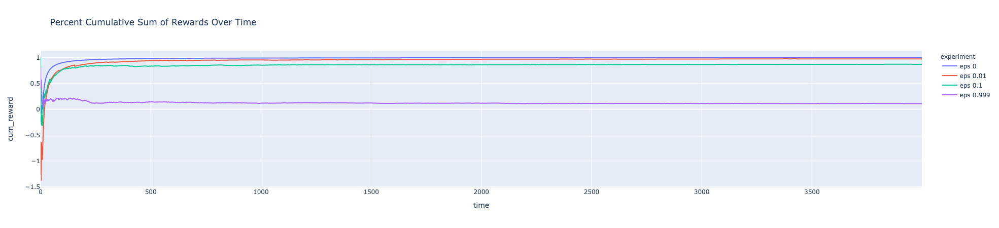

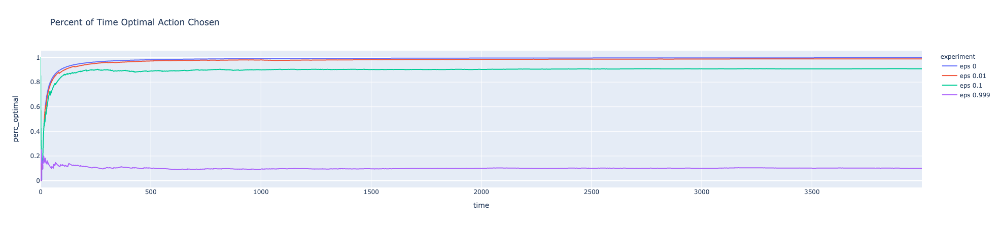

In [69]:
plot_percent_cumsum([e1, e2, e3, e4])
plot_percent_optimal_action([e1, e2, e3, e4])

### Observe the Estimate Action Value for Each Experiment Over Time

In [ ]:
e

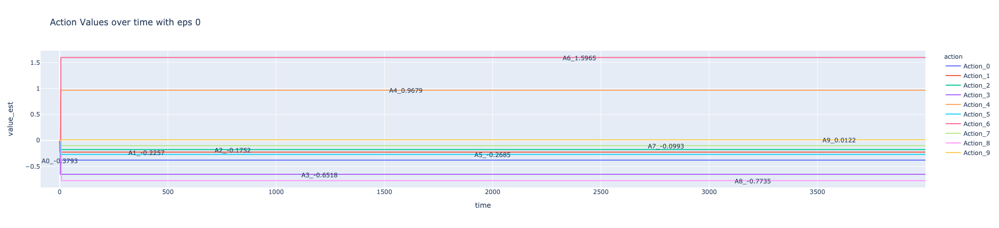

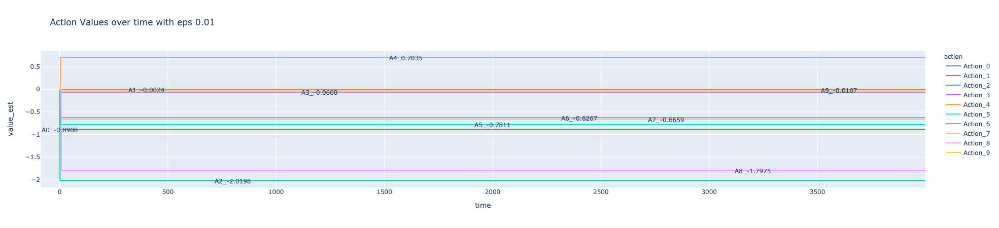

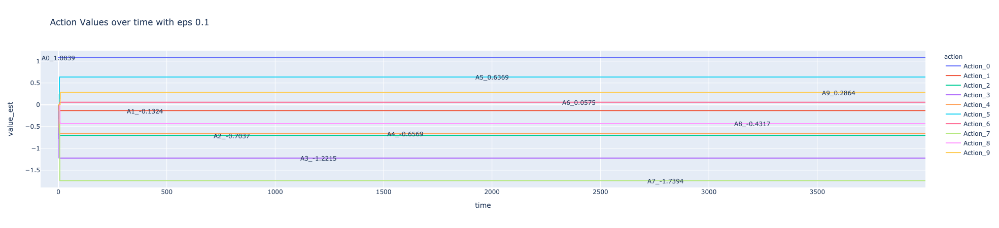

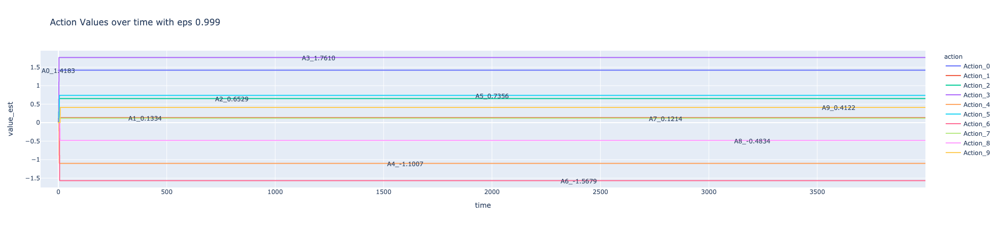

In [70]:
plot_q_t(e1)
plot_q_t(e2)
plot_q_t(e3)
plot_q_t(e4)

In [65]:
e4.a_count

{0: 396,
 1: 382,
 2: 404,
 3: 399,
 4: 371,
 5: 398,
 6: 431,
 7: 409,
 8: 404,
 9: 406}

### 10-Armed Testbed Part 2

The MasterExperiment implements multiple experiments with the same parameters. This is to understand how the value of $\epsilon$ affects the outcome of the rewards at scale. When you run the above experiments multiple times, you will notice very different results. Sometimes the greedy method locks in to the true optimal action immediately and outperforms the epsilon greedy methods. 

In [72]:
class MasterExperiment:
    """MasterExperiment implements the n-armed bandit problem sample_size number of times for a specific experiment setup."""
    def __init__(self, n_arms=10, epsilon=0, plays=1000, std_dev=1, sample_size=100):
        self.experiments = []
        self.avg_reward = []
        self.avg_percent_optimal_action = []
        self.n_arms = n_arms
        self.epsilon = epsilon
        self.plays = plays
        self.sample_size = sample_size
        for exp_num in range(sample_size):
            exp = Experiment(n_arms, epsilon, plays, std_dev)
            exp.run()
            self.experiments.append(exp)
            if exp_num % 10 == 0:
                print(f"Exp {exp_num}")
            
    def calc_avg_rewards(self):
        for t in range(self.plays):
            r_t = []
            for exp in self.experiments:
                r_t.append(exp.ar_t[t]['reward'])
            self.avg_reward.append(np.average(r_t))
    
    def calc_avg_percent_optimal_action(self):
        for exp in self.experiments:
            exp.calc_percent_optimal_action()
        for t in range(self.plays):
            opt_t =[]
            for exp in self.experiments:
                opt_t.append(exp.opt_action_chosen[t])
            self.avg_percent_optimal_action.append(np.average(opt_t))

    def run_calcs(self):
        self.calc_avg_rewards()
        self.calc_avg_percent_optimal_action()
        
def plot_avg_rewards(masters):
    data = {}
    t = list(range(masters[0].plays))
    data['time'] = t
    for m in masters:
        data[f"{m.epsilon}"] = m.avg_reward
    df = pd.DataFrame(data)
    df_long = pd.melt(df, id_vars=['time'], value_name="avg_reward", var_name="experiment")
    fig = px.line(df_long, x="time", y="avg_reward", color="experiment", title="Average Reward")
    fig.show()
    
def plot_percent_optimal(masters):
    data = {}
    t = list(range(masters[0].plays))
    data['time'] = t
    for m in masters:
        data[f"{m.epsilon}"] = m.avg_percent_optimal_action
    df = pd.DataFrame(data)
    df_long = pd.melt(df, id_vars=['time'], value_name="avg_perc_optimal", var_name="experiment")
    fig = px.line(df_long, x="time", y="avg_perc_optimal", color="experiment", title="Percent Optimal Action")
    fig.show()

In [74]:
n_arms = 10
plays = 2000
std_dev = 0
sample_size = 10
m1 = MasterExperiment(n_arms=n_arms, plays=plays, std_dev=std_dev, sample_size=sample_size)
m2 = MasterExperiment(n_arms=n_arms, epsilon=0.01, plays=plays, std_dev=std_dev, sample_size=sample_size)
m3 = MasterExperiment(n_arms=n_arms, epsilon=0.1, plays=plays, std_dev=std_dev, sample_size=sample_size)
m4 = MasterExperiment(n_arms=n_arms, epsilon=1, plays=plays, std_dev=std_dev, sample_size=sample_size)

Exp 0
Exp 0
Exp 0
Exp 0


In [76]:
m1.run_calcs()
m2.run_calcs()
m3.run_calcs()
m4.run_calcs()

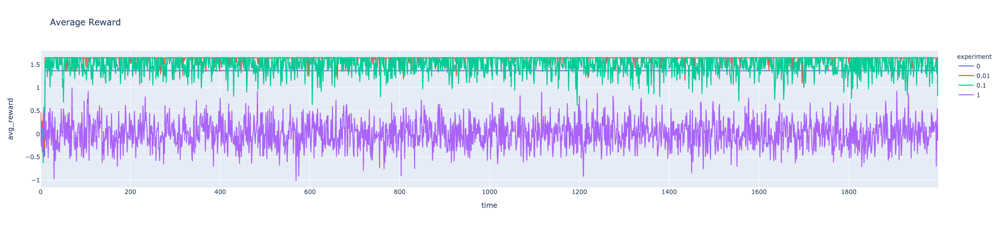

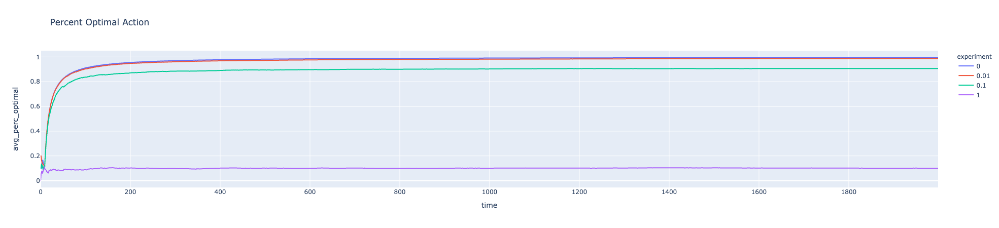

In [77]:
plot_avg_rewards([m1, m2, m3, m4])
plot_percent_optimal([m1, m2, m3, m4])